# 2. Image Enhancement

## Table of Contents
1. [Libraries](#libraries)
2. [Histogram Equalization](#hist)
3. [Denoising with Filters](#denoising)
4. [Challenge](#challenge)

## Importing Libraries <a class="anchor" id="libraries" ></a>

In [252]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.image as mpimg
from skimage import exposure
import skimage
from scipy.ndimage.filters import gaussian_filter as gauss
from scipy.ndimage.filters import median_filter as med
import cv2

<ipython-input-252-0238ad4d13f7>:7: DeprecationWarning: Please import `gaussian_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import gaussian_filter as gauss
<ipython-input-252-0238ad4d13f7>:8: DeprecationWarning: Please import `median_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import median_filter as med


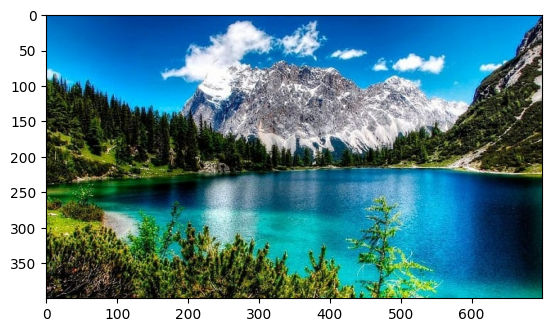

In [253]:
original_image = Image.open('data/image.jpg')
plt.imshow(original_image)
type(original_image)

# Save the image
np.save('data/img.npy', original_image)

#Load the image
original_image = np.load('data/img.npy')

## Histogram Equalization<a class="anchor" id="hist" ></a>

Let's look at the distribution of pixel values in the image.

Ideally, the image should have relatively even distribution of values, indicating good contrast and making it easier to extract analytical information.

An easy way to check this is to plot a histogram.

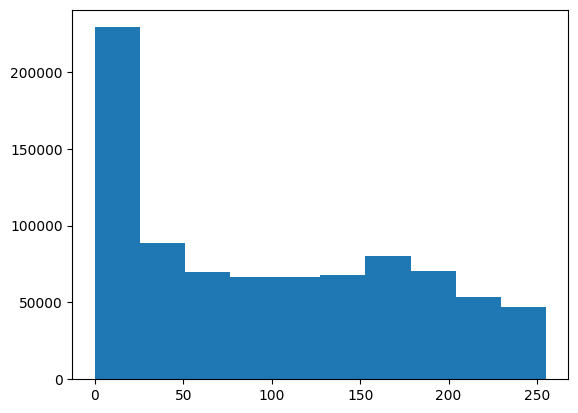

In [254]:
# Plot a histogram - we need to use ravel to "flatten" the 3 dimensions
plt.hist(original_image.ravel())
plt.show()

Another useful way to visualize the statistics of an image is as a cumulative distribution function (CDF) plot. Which shows the cumulative pixel intensity frequencies from 0 to 255.

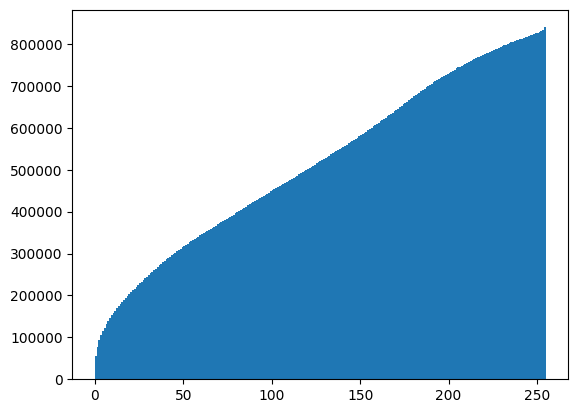

In [255]:
plt.hist(original_image.ravel(), bins=255, cumulative=True)
plt.show()

The histogram and CDF for our image show pretty uneven distribution - there's a lot of contrast in the image. Ideally we should equalize the values in the images we want to analyse to try to make our images more consistent in terms of the shapes they contain irrespective of light levels.

Histogram equalization is often used to improve the statistics of images. In simple terms, the histogram equalization algorithm attempts to adjust the pixel values in the image to create a more uniform distribution. The code in the cell below uses the  **exposure.equalize_hist** method from the **skimage** package to equalize the image.  

/usr/local/lib/python3.11/dist-packages/skimage/_shared/utils.py:445: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


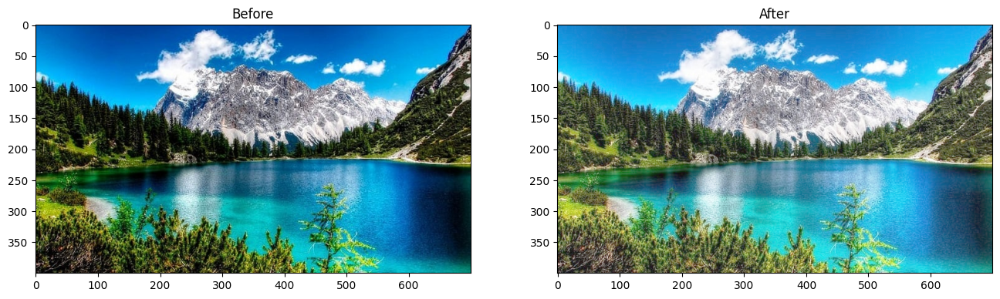

In [256]:
original_image_eq = exposure.equalize_hist(original_image)

fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(original_image_eq)
a.set_title('After')

plt.show()

As with most image operations, there's more than one way to do this. For example, you could also use the **PIL.ImgOps.equalize** method:

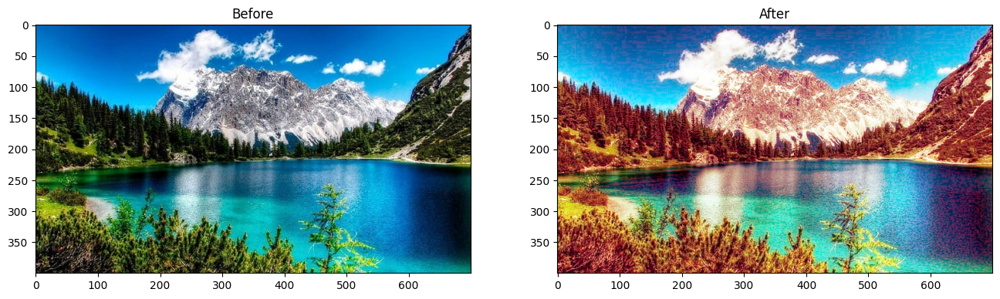

In [257]:

# Equalize the image - but we need to convert the numpy array back to the PIL image format
image_PIL_eq = ImageOps.equalize(Image.fromarray(original_image))

# Display using matplotlib

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.imshow(original_image)
a.set_title('Before')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.imshow(image_PIL_eq)
a.set_title('After')

plt.show()

Now let's see what that's done to the histogram and CDF plots:

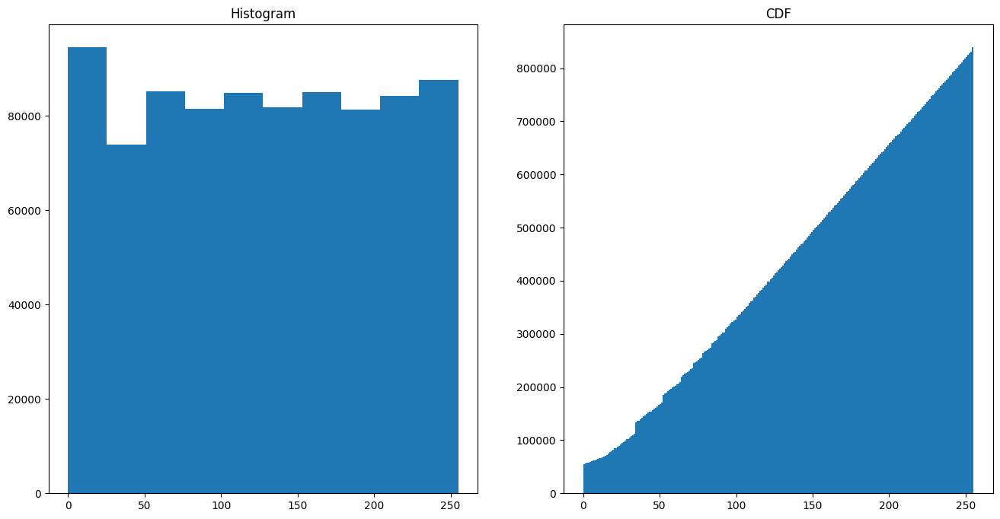

In [258]:
# Display histograms
img_eq = np.array(image_PIL_eq)

# Create a figure
fig = plt.figure(figsize=(16, 8))

# Subplot for original image
a=fig.add_subplot(1,2,1)
imgplot = plt.hist(img_eq.ravel())
a.set_title('Histogram')

# Subplot for processed image
a=fig.add_subplot(1,2,2)
imgplot = plt.hist(img_eq.ravel(), bins=255, cumulative=True)
a.set_title('CDF')

plt.show()

The pixel intensities are more evenly distributed in the equalized image. In particular, the cumulative density shows a straight diagonal cumulation; which is a good sign that the pixel intensity values have been equalized.

## Denoising with Filters <a class="anchor" id="denoising" ></a>

Often images need to be cleaned up to remove "salt and pepper" noise.

### Add Some Random Noise
Let's add some random noise to our image - such as you might see in a photograph taken in low light or at a low resolution.

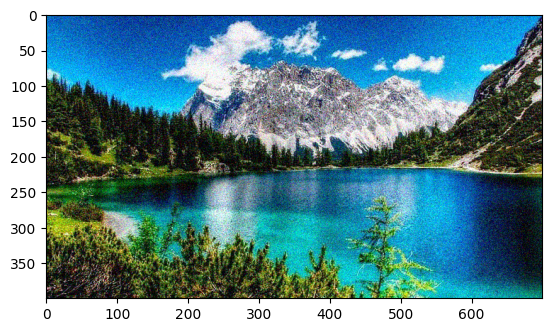

In [259]:
img_n = skimage.util.random_noise(original_image)
plt.imshow(img_n)

### Using a Gaussian Filter
A Gaussian filter applies a weighted average (mean) value for pixels based on the pixels that surround them.

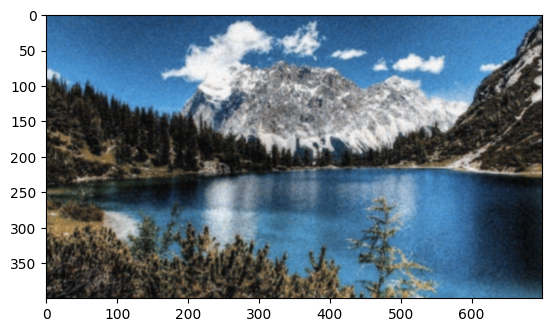

In [260]:
img3_gauss = gauss(img_n, sigma=1)
plt.imshow(img3_gauss)

### Using a Median Filter
The Gaussian filter results in a blurred image, which may actually be better for feature extraction as it makes it easier to find contrasting areas. If it's too blurred, we could try a median filter, which as the name suggests applies the median value to pixels based on the pixels around them.

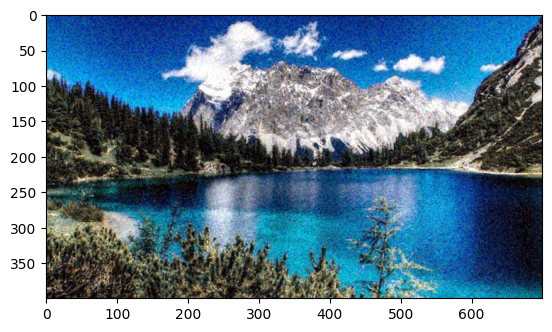

In [261]:
img_med = med(img_n, size=2)
plt.imshow(img_med)

## Challenge <a class="anchor" id="challenge" ></a>

Now, try solving this challenge, you must equalize different windows of the same image in a splitted way.

In [262]:
# !pip install image_slicer

In [263]:
import matplotlib.pyplot as plt
from image_slicer import slice, join

n = 4
tiles = slice('data/image.jpg', n)

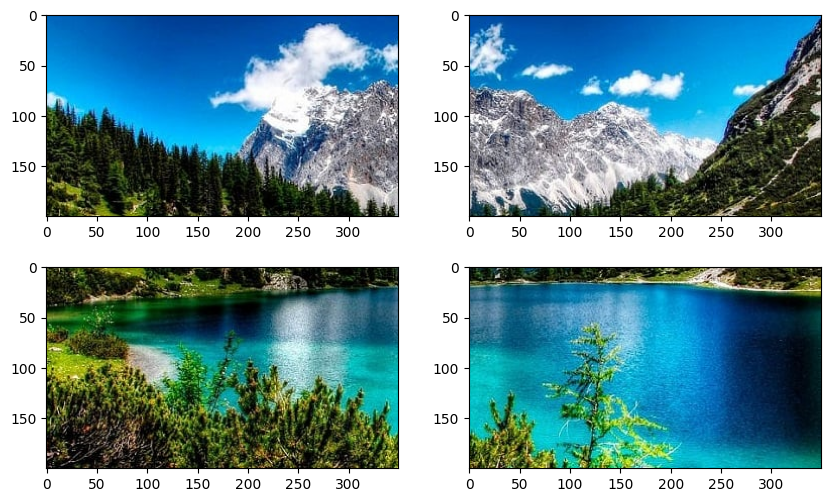

In [264]:
fig = plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
img = Image.open(f'data/image_01_01.png')
plt.imshow(img)

plt.subplot(2,2,2)
img = Image.open(f'data/image_01_02.png')
plt.imshow(img)

plt.subplot(2,2,3)
img = Image.open(f'data/image_02_01.png')
plt.imshow(img)

plt.subplot(2,2,4)
img = Image.open(f'data/image_02_02.png')
plt.imshow(img)

plt.show()

# Actividad

# Tile - based histogram equalization

1. __Investiga e implementa el método tile-based histogram equalization. En estos métodos, la imagen se particiona en diferentes ventanas (i.e. mosaicos) y los histogramas se calculan de forma independiente, aplicando la corrección sobre cada ventana. Existe un compromiso entre el tamaño de la ventana y la complejidad computacional, por lo cual es más complejo que el método simple. Implementa esta versión y realiza algunas pruebas variando el tamaño de la ventana. Otro inconveniente es que se puede observar posibles diferencias entre los el contraste de los bloques, ¿cómo podría mejorarse?__

El método tile - based aplica el mismo principio de eualización a cada uno de los mosaicos generados, a medida que aumenta el número de mosaicos la complejidad computacional aumenta ya que es necesario generar N equlizaciones para los N mosaicos.

Ejemplo de ecualización aplicada al tile 1

Text(0.5, 1.0, 'Equalized Histogram')

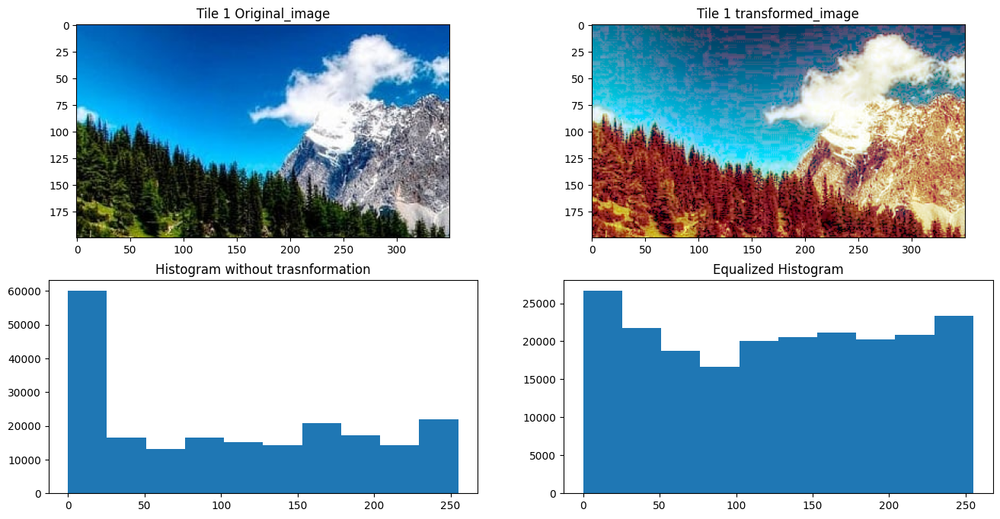

In [265]:
tile_1 = tiles[0]
tile_1_image = tile_1.image
tile_1_image_array = np.array(tile_1_image)
tile_1_image_transf = ImageOps.equalize(Image.fromarray(np.array(tile_1.image)))
tile_1_image_transf = np.array(tile_1_image_transf)

# Create a figure
fig = plt.figure(figsize=(16,8))


a=fig.add_subplot(2,2,1)
imgplot = plt.imshow(tile_1_image)
a.set_title('Tile 1 Original_image')

a=fig.add_subplot(2,2,2)
imgplot = plt.imshow(tile_1_image_transf)
a.set_title('Tile 1 transformed_image')

a=fig.add_subplot(2,2,3)
imgplot = plt.hist(tile_1_image_array.ravel())
a.set_title('Histogram without trasnformation')

a=fig.add_subplot(2,2,4)
imgplot = plt.hist(tile_1_image_transf.ravel())
a.set_title('Equalized Histogram')


In [266]:
# plot tiles of images function

def plot_images(original_image, transformed_image):
    plt.figure(figsize=([15, 15]))
    plt.subplot(121),plt.imshow(original_image)
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(transformed_image)
    plt.title('Transformed Image'), plt.xticks([]), plt.yticks([])

In [267]:
for i,tile in enumerate(tiles):
  print(i,tile)

0 <Tile #1 - image_01_01.png>
1 <Tile #2 - image_01_02.png>
2 <Tile #3 - image_02_01.png>
3 <Tile #4 - image_02_02.png>


<Figure size 1000x600 with 0 Axes>

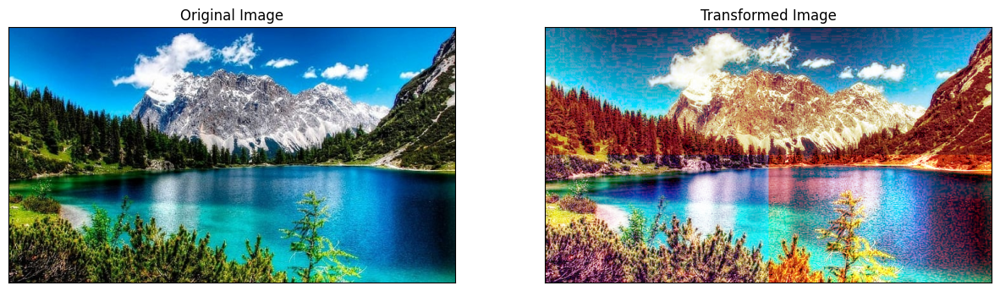

In [268]:
fig = plt.figure(figsize=(10, 6))

for i,tile in enumerate(tiles):
    # apply equlize method described above
    tile.image = ImageOps.equalize(Image.fromarray(np.array(tile.image)))

equilizedImg = join(tiles)
plot_images(original_image, equilizedImg)

# Sliding Window Adaptive Histogram Equalization (SWAHE)

2. __Investiga e implementa un método sencillo del Sliding Window Adaptive Histogram Equalization (SWAHE) y compara algunas imágenes con diferentes tipos de imágenes.__ Este método es similar a la aplicación de ecualizaciones en N histógramas, sin embargo se vuelve más complejo porque el mosaico se desliza  un pixel a la vez, lo que implica que el número de mosaicos aumenta a N mosaicos generados para P pixeles hasta recorrer la imagen completa. El historgrama presentará mejor ajuste que el método de mosaicos fijos y además se ajustará a los mosaicos vecinos, pero aumentará el tiempo de procesamiento. Como referencia la siguiente explicación: https://www.youtube.com/watch?v=bXrQN5m5qTo

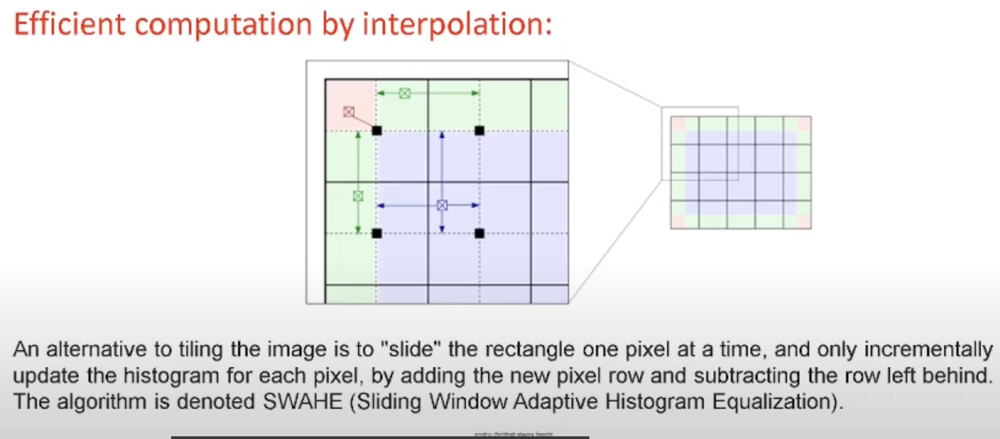

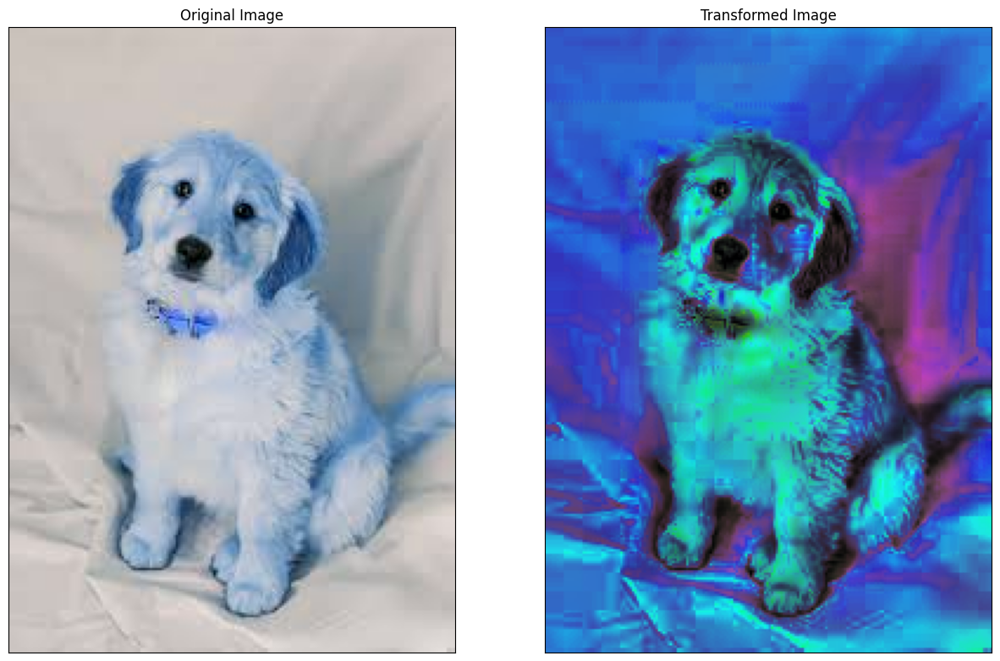

In [269]:

def swahe(image):
    # Convert the image to the HSV space
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    hue, sat, val = cv2.split(hsv)
    # Adjust saturation and value chanels
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    sat = clahe.apply(sat)
    val = clahe.apply(val)
    hsv = cv2.merge((hue, sat, val))
    input_img = cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)
    return input_img

original_img = cv2.imread('data/dog_image.jpeg')
swahe_img = swahe(original_img)

plot_images(original_img, swahe_img)

# CLAHE (Contrast Limited Adaptive Histogram Equalization)

__3. Investiga cómo funciona el algoritmo CLAHE (contrast limited adaptive histogram equalization) y realiza una implementación (puede ser usando la implementación de OpenCV). Prueba sobre diferentes tipos de imágenes y compara con el método de ecualización de histogramas básico. Provee una breve descripción del método a partir de una  investigación bibliográfica.__

El método es similar a SWAHE, pero a diferencia del SWAHE que amplifica el ruido de las imágenes, CLAHE establece un limit en la amplificiación de contraste, estableciendo un límite al histógrama que distribuye las frecuencias originales obtenidas a frecuencias más "planas". Esto ayudar a equalizar a través de toda la imágen, manteniendo información sin pronunciar el ruido generado.
 https://www.youtube.com/watch?v=bXrQN5m5qTo

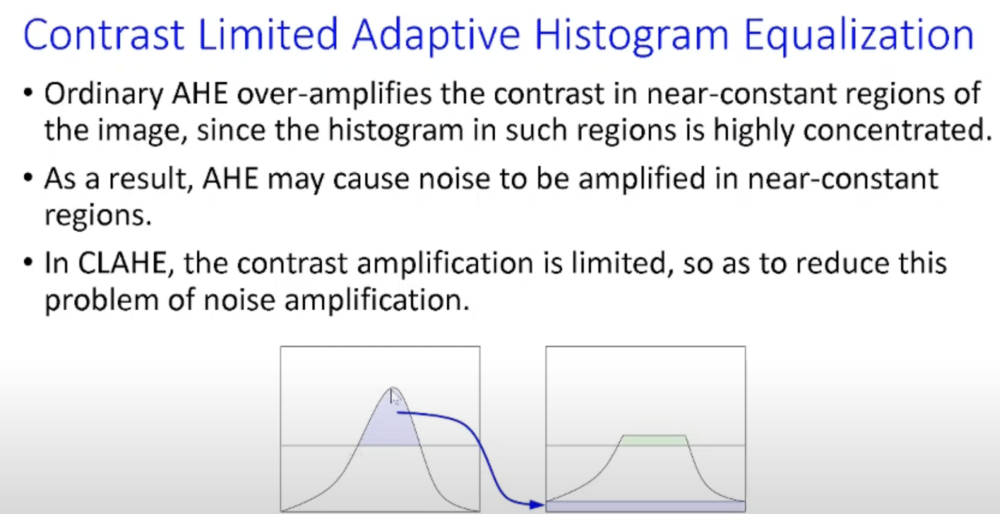

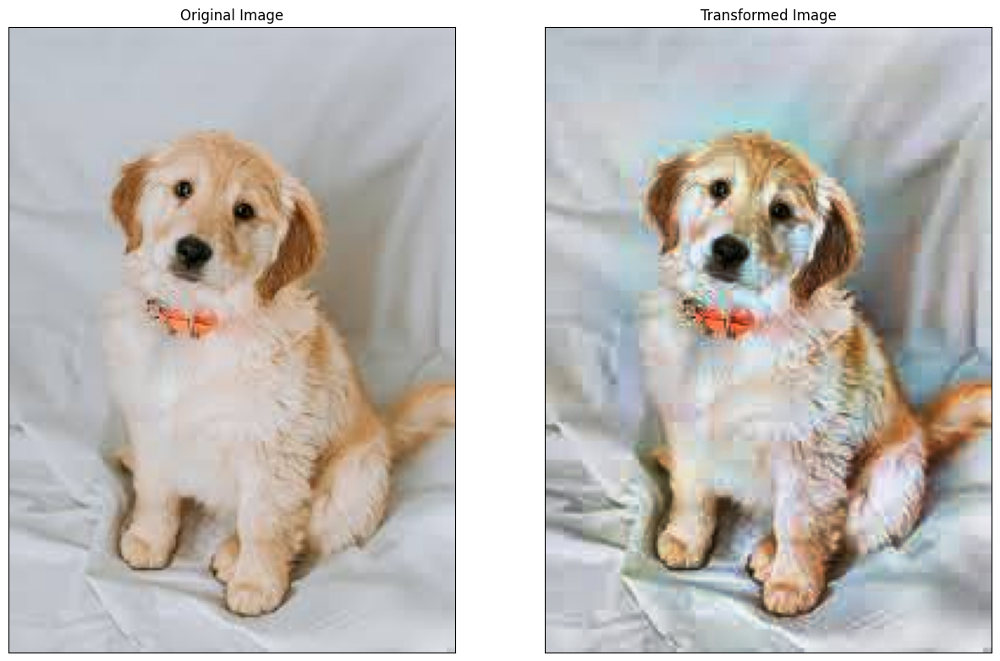

In [270]:
original_img = cv2.imread('data/dog_image.jpeg')
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)


clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))

#We apply CLAHE to all channels on RGB
channelb = clahe.apply(original_img[:,:,0])
channelg = clahe.apply(original_img[:,:,1])
channelr = clahe.apply(original_img[:,:,2])

#We stack all the channels back into a single RGB array
claheRGBImage = np.stack((channelb,channelg,channelr), axis=2)


plot_images(original_img, claheRGBImage)

In [1]:
for i in range(2, 17, 4):
    print(i)

2
6
10
14
